In [1]:
cd ../

/Users/sowonjeong/Documents/GitHub/GNN-Geometry


In [2]:
import matplotlib.pyplot as plt
import torch
from models.grace import *
from models.train_models import train_grace
from models.baseline_models import *
from simulation_utils.helix import *
from metrics import *

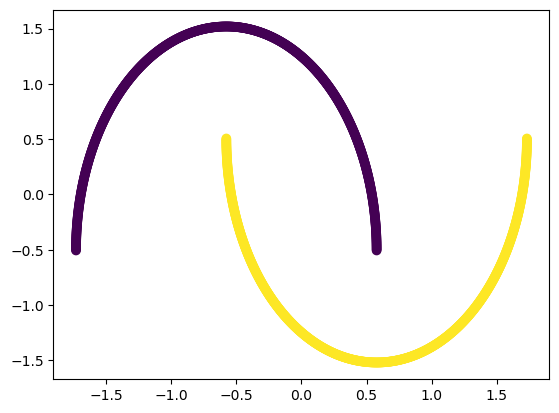

In [38]:
X,c, A, dataset = get_moons(n_samples=1500, shuffle=True, noise=None, random_state= 0,
                        n_neighbours = 5, features = 'coordinates', standardize=True)
plt.scatter(X[:,0], X[:,1], c=c)

In [26]:
exp = 25
circles = {}
for i in range(exp):
    X,c, A, dataset = get_circles(n_samples=1500, shuffle=True, noise=0.1, random_state= i, factor=0.5,
                        n_neighbours = 5, features = 'coordinates', standardize=True)
    perfect_embedding = X
    alpha = np.arange(0,1.1,0.1)
    for types in ["symmetric","RW"]:
        for j in np.arange(10):
            model = train_grace(dataset, 32, 2, n_layers=1, tau=0.5,
                        epochs=500, wd=1e-3, lr=1e-1, fmr=0.2, edr =0.5,
                        proj="nonlinear-hid", name_file="test", device=None,
                        gnn_type= types, alpha=alpha[j+1], beta = 1,add_self_loops= True)
            out_tmp = model.get_embedding(dataset)
            Y = out_tmp.detach().numpy()
            _,_,cor,_ = spearman_correlation_eval(perfect_embedding, out_tmp)
            knn_eval = neighbor_kept_ratio_eval(dataset,out_tmp, n_neighbors = 5)
            dens = eval_density_preserve(X,Y, sigma = 1.0, min_dist = 1e-3)
            circles[types + '_' + str(alpha[j+1]) + '_' +  str(i)]  =  {'global_m': cor, 'local_m' : knn_eval, 'density': dens,
                                            'seed' : i,
                                            'gnn_type': types,
                                            'embedding' : out_tmp,
                                            'exp number': i,
                                            'alpha': alpha[j+1]}



=== train GRACE model ===
Epoch=000, loss=7.7131
Epoch=001, loss=8.0284
Epoch=002, loss=7.3780
Epoch=003, loss=7.3397
Epoch=004, loss=8.4136
Epoch=005, loss=7.3161
Epoch=006, loss=7.3168
Epoch=007, loss=7.5042
Epoch=008, loss=7.3121
Epoch=009, loss=8.2632
Epoch=010, loss=7.5239
Epoch=011, loss=8.2013
Epoch=012, loss=8.1459
Epoch=013, loss=8.0696
Epoch=014, loss=7.6002
Epoch=015, loss=7.6399
Epoch=016, loss=7.9337
Epoch=017, loss=7.6989
Epoch=018, loss=7.7120
Epoch=019, loss=8.0679
Epoch=020, loss=8.0908
Epoch=021, loss=7.9319
Epoch=022, loss=7.7349
Epoch=023, loss=7.6477
Epoch=024, loss=7.7682
Epoch=025, loss=7.9254
Epoch=026, loss=8.1694
Epoch=027, loss=7.4863
Epoch=028, loss=7.9015
Epoch=029, loss=7.4437
Epoch=030, loss=7.8604
Epoch=031, loss=7.8275
Epoch=032, loss=7.3966
Epoch=033, loss=7.3828
Epoch=034, loss=7.3665
Epoch=035, loss=8.4550
Epoch=036, loss=7.3456
Epoch=037, loss=8.1077
Epoch=038, loss=7.5462
Epoch=039, loss=8.1442
Epoch=040, loss=8.1456
Epoch=041, loss=7.3617
Epoch=04

In [4]:
import pickle

# Store data 
with open('circle-repeat.pkl', 'wb') as file: # factor = 0.8
    # A new file will be created
    pickle.dump(circles, file)

In [27]:
import pickle

# Store data 
with open('circle-repeat5.pkl', 'wb') as file: # factor = 0.5
    # A new file will be created
    pickle.dump(circles, file)

In [28]:
tab = pd.DataFrame.from_dict(circles).T
tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_56746/2290380754.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.707477  0.469924  0.742906
          0.2    0.667274  0.498066  0.732743
          0.3    0.682829  0.514960  0.754295
          0.4    0.661492  0.484722  0.720039
          0.5    0.702610  0.538193  0.793394
          0.6    0.690065  0.538197  0.773510
          0.7    0.698945  0.557677  0.781071
          0.8    0.682265  0.574423  0.779816
          0.9    0.708861  0.636176  0.799989
          1.0    0.688132  0.623697  0.765020
symmetric 0.1    0.750020  0.602430  0.685522
          0.2    0.697662  0.525981  0.655130
          0.3    0.780900  0.618374  0.805534
          0.4    0.742290  0.552978  0.777339
          0.5    0.689838  0.520012  0.751108
          0.6    0.664504  0.518932  0.738789
          0.7    0.706332  0.584044  0.755787
          0.8    0.671783  0.585224  0.690339
          0.9    0.656403  0.539211  0.658308
          1.0    0.662121  0.615803  0.646256

In [29]:
tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_56746/2954017120.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.116987  0.141472  0.127787
          0.2    0.056256  0.101425  0.098492
          0.3    0.081470  0.106922  0.102742
          0.4    0.064367  0.104671  0.089544
          0.5    0.098074  0.099617  0.108156
          0.6    0.094120  0.118244  0.108552
          0.7    0.098692  0.121036  0.113402
          0.8    0.074175  0.126151  0.102968
          0.9    0.111171  0.132815  0.109991
          1.0    0.096090  0.151180  0.107628
symmetric 0.1    0.143905  0.084399  0.128707
          0.2    0.126730  0.130160  0.124790
          0.3    0.149479  0.032847  0.124330
          0.4    0.152814  0.125808  0.140032
          0.5    0.112413  0.139834  0.113267
          0.6    0.044406  0.140560  0.096481
          0.7    0.108695  0.118108  0.130153
          0.8    0.072435  0.147506  0.088833
          0.9    0.040093  0.170988  0.070506
          1.0    0.046361  0.123376  0.062668

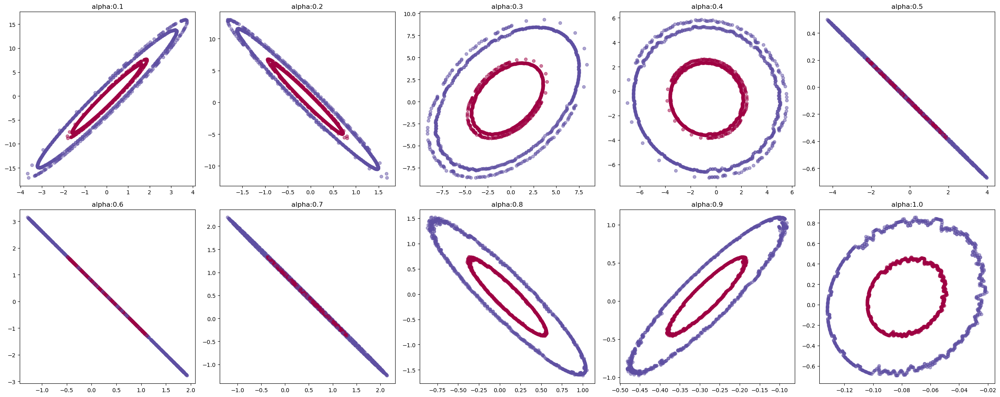

In [31]:
# row_normalized
X,c, A, dataset = get_circles(n_samples=1500, shuffle=True, noise=None, random_state= 0, factor=0.5,
                        n_neighbours = 5, features = 'coordinates', standardize=True)
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(circles['symmetric_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,0],circles['symmetric_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,1], c = c, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i+1],1)))
plt.tight_layout()
plt.show()

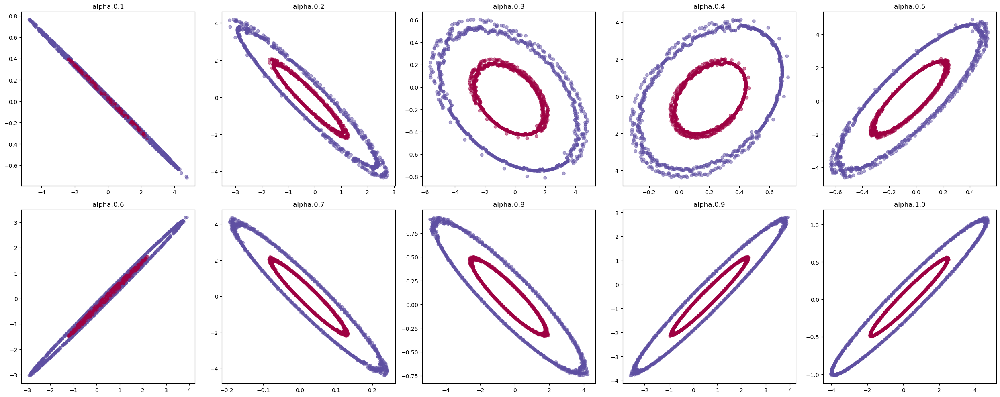

In [32]:
# row_normalized
X,c, A, dataset = get_circles(n_samples=1500, shuffle=True, noise=None, random_state= 0, factor=0.5,
                        n_neighbours = 5, features = 'coordinates', standardize=True)
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(circles['RW_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,0],circles['RW_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,1], c = c, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i+1],1)))
plt.tight_layout()
plt.show()

In [6]:
exp = 25
moons = {}
for i in range(exp):
    X,c, A, dataset = get_moons(n_samples=1500, shuffle=True, noise=None, random_state= i, 
                        n_neighbours = 5, features = 'coordinates', standardize=True)
    perfect_embedding = X
    alpha = np.arange(0,1.1,0.1)
    for types in ["symmetric","RW"]:
        for j in np.arange(10):
            model = train_grace(dataset, 32, 2, n_layers=1, tau=0.5,
                        epochs=500, wd=1e-3, lr=1e-1, fmr=0.2, edr =0.5,
                        proj="nonlinear-hid", name_file="test", device=None,
                        gnn_type= types, alpha=alpha[j+1], beta = 1,add_self_loops= True)
            out_tmp = model.get_embedding(dataset)
            Y = out_tmp.detach().numpy()
            _,_,cor,_ = spearman_correlation_eval(perfect_embedding, out_tmp)
            knn_eval = neighbor_kept_ratio_eval(dataset,out_tmp, n_neighbors = 5)
            dens = eval_density_preserve(X,Y, sigma = 1.0, min_dist = 1e-3)
            moons[types + '_' + str(alpha[j+1]) + '_' +  str(i)]  =  {'global_m': cor, 'local_m' : knn_eval, 'density': dens,
                                            'seed' : i,
                                            'gnn_type': types,
                                            'embedding' : out_tmp,
                                            'exp number': i,
                                            'alpha': alpha[j+1]}



=== train GRACE model ===
Epoch=000, loss=7.7465
Epoch=001, loss=8.3882
Epoch=002, loss=7.8107
Epoch=003, loss=8.1154
Epoch=004, loss=8.0307
Epoch=005, loss=7.8767
Epoch=006, loss=7.9291
Epoch=007, loss=7.9852
Epoch=008, loss=7.9701
Epoch=009, loss=7.8235
Epoch=010, loss=8.0284
Epoch=011, loss=8.0409
Epoch=012, loss=7.8577
Epoch=013, loss=7.6085
Epoch=014, loss=8.0559
Epoch=015, loss=7.5020
Epoch=016, loss=7.4526
Epoch=017, loss=8.7884
Epoch=018, loss=8.2012
Epoch=019, loss=7.3978
Epoch=020, loss=8.1948
Epoch=021, loss=7.4072
Epoch=022, loss=7.4038
Epoch=023, loss=8.7674
Epoch=024, loss=7.4080
Epoch=025, loss=7.5853
Epoch=026, loss=7.4088
Epoch=027, loss=7.3947
Epoch=028, loss=7.3732
Epoch=029, loss=8.4353
Epoch=030, loss=7.3383
Epoch=031, loss=7.3284
Epoch=032, loss=7.3177
Epoch=033, loss=7.3012
Epoch=034, loss=8.0800
Epoch=035, loss=7.2819
Epoch=036, loss=7.8949
Epoch=037, loss=7.2695
Epoch=038, loss=7.4563
Epoch=039, loss=7.2683
Epoch=040, loss=7.7755
Epoch=041, loss=7.5437
Epoch=04

In [45]:
X,c, A, dataset = get_moons(n_samples=1500, shuffle=True, noise=None, random_state= 3, 
                        n_neighbours = 5, features = 'coordinates', standardize=True)
for j in range(10):
    Y = moons['RW_'+str(alpha[j+1])+'_3']['embedding'].detach().numpy()
    dens = eval_density_preserve(X,Y, sigma = 1.0, min_dist = 1e-3)
    print(dens)

0.1135070376932127
-0.23776726424596067
0.1414259298264123
0.022650375399344586
0.2410523982960841
-0.5938323098317362
-0.10454363979722238
0.5818986249215317
0.39310625221245266
0.13679565519814102


In [7]:
# Store data 
with open('moon-repeat.pkl', 'wb') as file:
    # A new file will be created
    pickle.dump(moons, file)

In [19]:
tab2 = pd.DataFrame.from_dict(moons).T
tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_56746/3012975969.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.862899  0.332463  0.121646
          0.2    0.854850  0.317695  0.012876
          0.3    0.864097  0.322199  0.195311
          0.4    0.853319  0.315009  0.125052
          0.5    0.868151  0.326126  0.210044
          0.6    0.861318  0.334887  0.112252
          0.7    0.865604  0.352617  0.211511
          0.8    0.867283  0.370482  0.208708
          0.9    0.863107  0.395016  0.192664
          1.0    0.868688  0.445546  0.252172
symmetric 0.1    0.858162  0.474996  0.309068
          0.2    0.865276  0.461232  0.181230
          0.3    0.867135  0.431725  0.237696
          0.4    0.870156  0.391141  0.222248
          0.5    0.873561  0.382706  0.216486
          0.6    0.867150  0.396949  0.245689
          0.7    0.869516  0.394253  0.266424
          0.8    0.866514  0.404724  0.167988
          0.9    0.859209  0.457264 -0.043061
          1.0    0.862072  0.422257 -0.232366

In [20]:
tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_56746/2556064042.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.026681  0.060057  0.275018
          0.2    0.010014  0.049795  0.252623
          0.3    0.012490  0.068517  0.222168
          0.4    0.030315  0.054642  0.254522
          0.5    0.025761  0.061749  0.267753
          0.6    0.026464  0.060609  0.374933
          0.7    0.004726  0.055802  0.245772
          0.8    0.022079  0.069904  0.354790
          0.9    0.012785  0.075831  0.312230
          1.0    0.023003  0.103466  0.287211
symmetric 0.1    0.007043  0.059199  0.284648
          0.2    0.031549  0.075486  0.360036
          0.3    0.020706  0.059820  0.315012
          0.4    0.026917  0.080247  0.296798
          0.5    0.036180  0.076365  0.327677
          0.6    0.046710  0.080723  0.346808
          0.7    0.022946  0.076227  0.315266
          0.8    0.010817  0.076001  0.208939
          0.9    0.013433  0.055833  0.181038
          1.0    0.008855  0.095853  0.230653

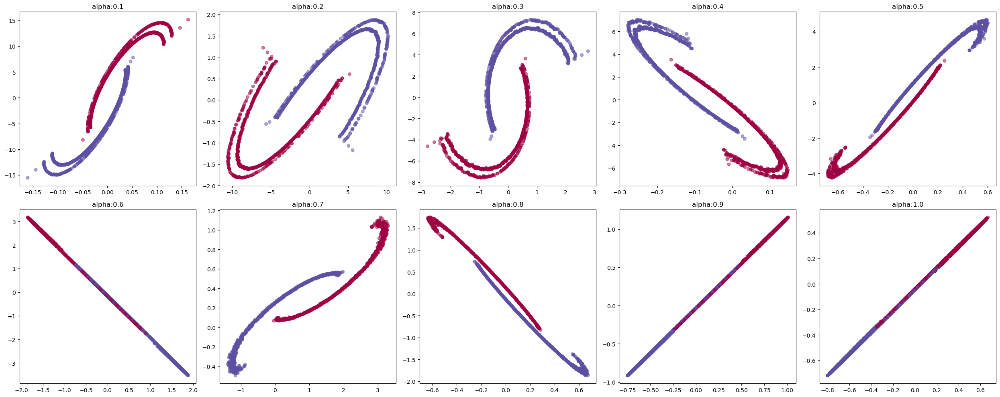

In [16]:
# row_normalized
X,c, A, dataset = get_moons(n_samples=1500, shuffle=True, noise=None, random_state= 0, 
                        n_neighbours = 5, features = 'coordinates', standardize=True)
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(moons['symmetric_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,0],moons['symmetric_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,1], c = c, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i+1],1)))
plt.tight_layout()
plt.show()

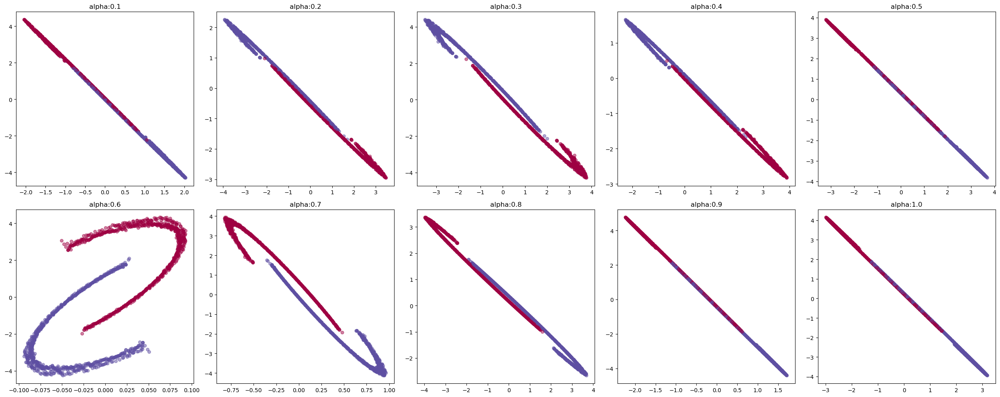

In [15]:
# row_normalized
X,c, A, dataset = get_moons(n_samples=1500, shuffle=True, noise=None, random_state= 0, 
                        n_neighbours = 5, features = 'coordinates', standardize=True)
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(moons['RW_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,0],moons['RW_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,1], c = c, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i+1],1)))
plt.tight_layout()
plt.show()

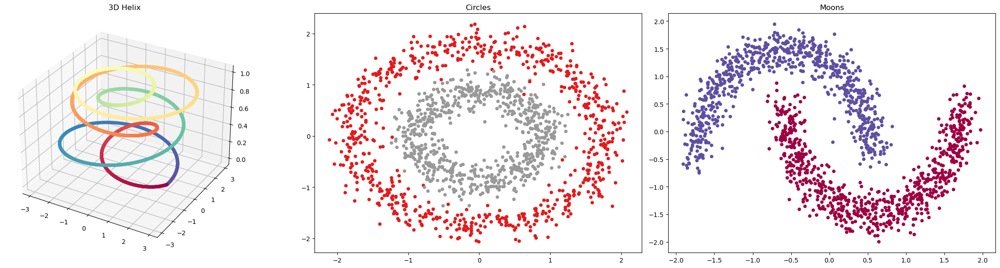

In [72]:
x,y,z,t, A,new_data = get_vhelix(uniform = True, n_samples = 5000)

X,c, _, _  = get_circles(n_samples=1500, shuffle=True, noise=0.1, random_state= 0,factor=0.5,
                        n_neighbours = 5, features = 'coordinates', standardize=True)


Y,d, _, _ = get_moons(n_samples=1500, shuffle=True, noise=0.1, random_state= 0,
                        n_neighbours = 5, features = 'coordinates', standardize=True)


# plotting
fig = plt.figure(figsize = (23,6))
ax = fig.add_subplot(131, projection='3d')
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t, s= 20)
ax.set_title('3D Helix')
ax = fig.add_subplot(132)
ax.scatter(X[:,0], X[:,1], c=c, cmap = 'Set1', s = 20)
ax.set_title('Circles')
ax = fig.add_subplot(133)
ax.scatter(Y[:,0], Y[:,1], c=d, cmap ='Set1', s = 20)
ax.set_title('Moons')
plt.tight_layout()
plt.show()  # show train_acc and test_acc together
